# Imports

In [1]:
import scanpy as sc

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib

import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import scipy
from scipy.stats import spearmanr
from scipy.stats import zscore
from scipy.stats import pearsonr
from sklearn.metrics import pairwise_distances

# utils function -- helper functions for plotting
import sys
sys.path.append('../../utils/')
import figure_utils as figure_utils

In [2]:
# create figures directory
import os

directory_path = 'figures'
if not os.path.exists(directory_path):
    # If not, create the directory
    os.makedirs(directory_path)
    print(f"Directory '{directory_path}' created successfully.")
else:
    print(f"Directory '{directory_path}' already exists.")

Directory 'figures' created successfully.


# Plot aesthetics

In [3]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 500 # 150 dpi resolution
matplotlib.rcParams['image.cmap'] = 'Spectral_r' # preferred color map
# matplotlib.rcParams['figure.figsize'] = [6, 6] # Square
# no bounding boxes or axis:
matplotlib.rcParams['axes.spines.bottom'] = "off"
matplotlib.rcParams['axes.spines.top'] = "off"
matplotlib.rcParams['axes.spines.left'] = "off"
matplotlib.rcParams['axes.spines.right'] = "off"

In [4]:
# UMAP PARAMS
DOT_SIZE = 25
LEGEND_FONTSIZE = 8
LEGEND_FONTOUTLINE = 1
UMAP_FIGSIZE = (10,10)

# Sheath and Socket colors
SHEATH_COLOR = '#3ac9c9' 
SOCKET_COLOR = '#c47841'


# SEXES COLOR -- NEW
HERM_COLOR = '#ff8b00'
MALE_COLOR = '#2258a5'
SHARED_SEX_COLOR = '#349c55'

# Load Data

In [5]:
adata = sc.read('../../data/GliaOnly.h5ad')
adata

AnnData object with n_obs × n_vars = 20810 × 12376
    obs: 'Celltype', 'sex_specificity', 'leiden_postBC', 'sex', 'SheathSocket_label', 'Compartments', 'leiden_preBC', 'cluster_sex_label', 'Cluster_Celltype'
    var: 'highly_variable', 'previous_highly_variable', 'transcription_factors', 'transporters', 'neuropeptides', 'gene_ids'
    uns: 'BatchCorrected_LeidenClusters_colors', 'Celltype_colors', 'Cluster_Celltype_colors', 'Compartments_colors', 'FiguresData_Sheath_Selection_Results', 'FiguresData_Socket_Selection_Results', 'SheathSocket_L2_GeneRanking_Order', 'SheathSocket_Probability_Estimates', 'SheathSocket_label_colors', 'Validations_colors', 'cluster_sex_label_colors', 'dendrogram_Cluster_Celltype', 'gene_validations', 'leiden_noBC_colors', 'leiden_postBC_colors', 'sex_colors', 'sex_frac_Glia_postBC', 'sex_specificity_colors'
    obsm: 'DM_EigenVectors_postBC', 'X_pca', 'X_pca_harmony', 'X_umap', 'X_umap_noBC'
    varm: 'cluster_means', 'pairwise_cluster_count'
    layers: 'mag

# SFig 3A -- <i>ttr-59 & Y67D8C.7 </i> Expression

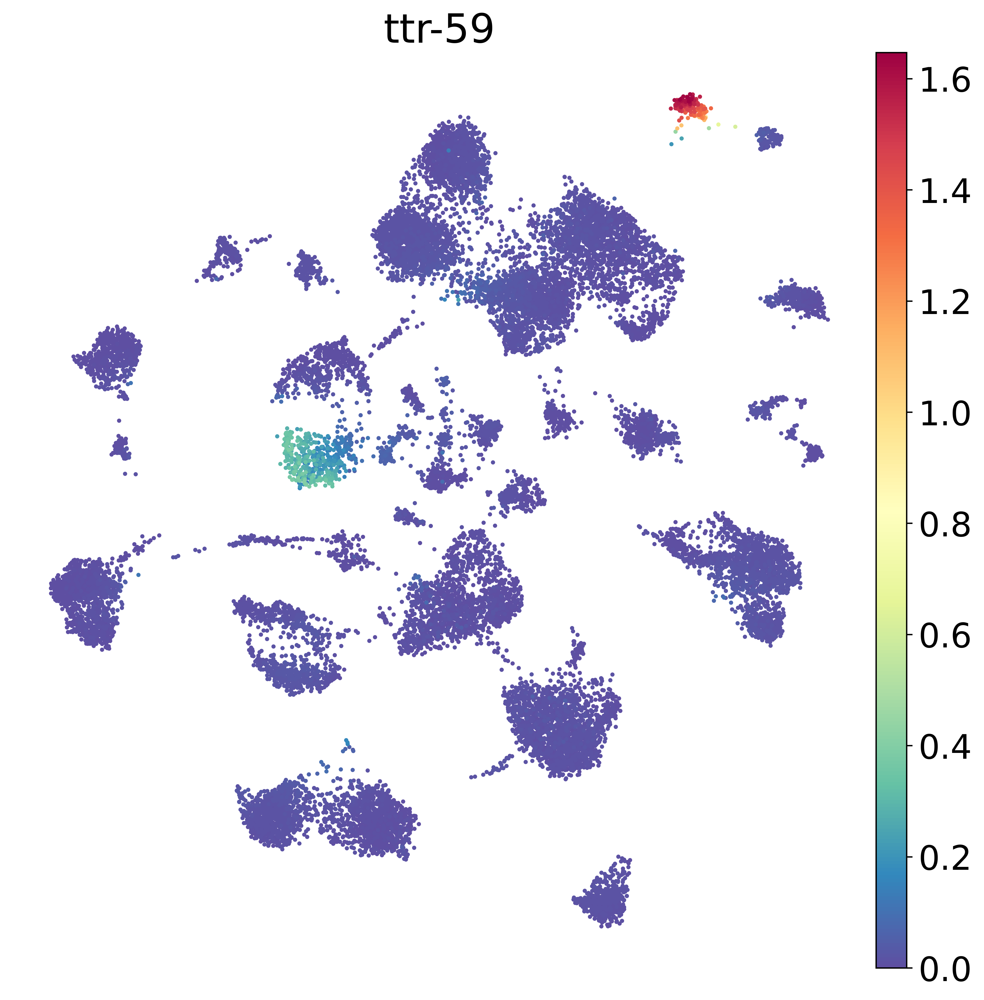

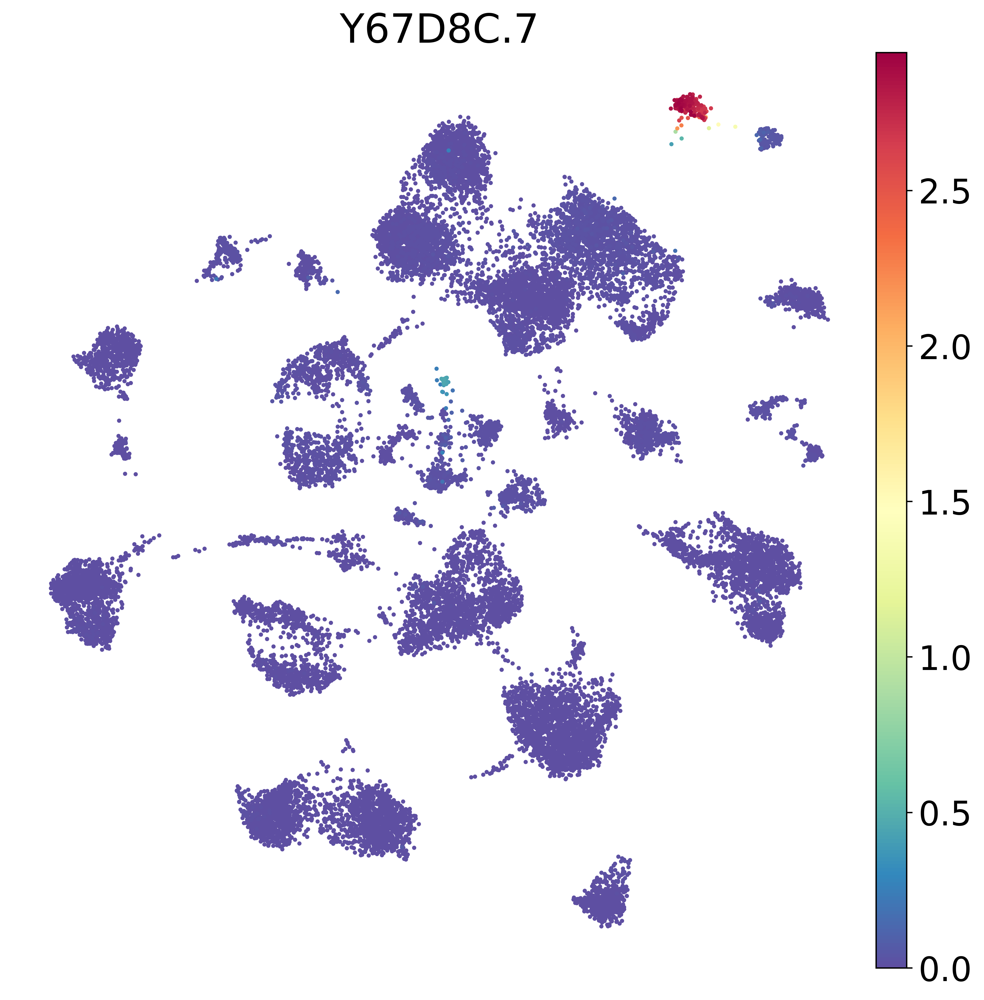

In [6]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 20.0}):
    PLOT_GENES = ['ttr-59','Y67D8C.7']
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S3A_{gene}.png',
            layer='magic_imputed_postBC'
        )

<!-- # SFig 3C -- <i>K08D12.4, lpr-4 & Y57E12AL.4</i> Expression -->
# SFig 3C -- <i>Y57E12AL.4</i> Expression

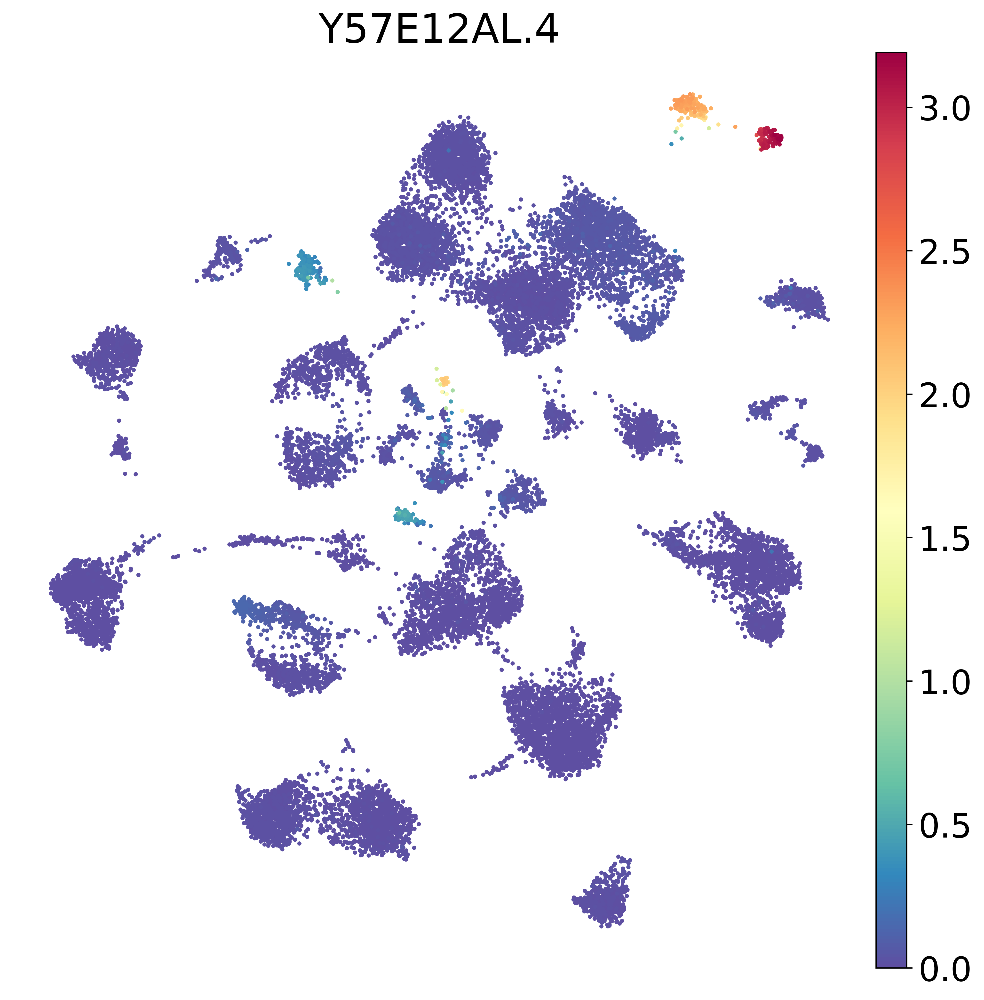

In [7]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 20.0}):
    # PLOT_GENES = ['K08D12.4','lpr-4', 'Y57E12AL.4']
    PLOT_GENES = ['Y57E12AL.4']
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S3C_{gene}.png',
            layer='magic_imputed_postBC'
        )

# SFig 3F -- Cosine Similarity

In [8]:
# gene expression matrix
gene_exp = pd.DataFrame(adata.X.toarray().copy(), index=adata.obs_names, columns=adata.var_names)
gene_exp.loc[:,'Cluster_Celltype'] = adata.obs['Cluster_Celltype'].copy()

# compute the mean expression
mean_gene_exp = gene_exp.groupby('Cluster_Celltype').mean()

# subset to just hvg -- computed using the highly variable genes in the dataset
hvg_mean_exp = mean_gene_exp.loc[:,adata.var.highly_variable]

# compute the similarity -- THIS IS THE SAME SIMILARITY PARAMS IN THE UTILS FUNCTIONS USED IN OTHER ANALYSES
similarity = pd.DataFrame(pairwise_distances(hvg_mean_exp, metric='cosine'), index=hvg_mean_exp.index, columns=hvg_mean_exp.index)

In [9]:
# add sheath socket colors
cluster_colors = adata.obs.loc[:,['Cluster_Celltype','SheathSocket_label']].copy()
cluster_colors.loc[:,'colors'] = cluster_colors.loc[:,'SheathSocket_label'].map({'Sheath':SHEATH_COLOR,'Socket':SOCKET_COLOR})
SHSO_colors_lut = dict(cluster_colors.loc[:,['Cluster_Celltype','colors']].values)

with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 15.0}):
    # plot the cosine distance
    ax = sns.clustermap(
        1 - similarity,
        cmap='RdBu_r',
#         cmap='coolwarm',
        xticklabels=True,
        yticklabels=True,
        linewidth=0.005,
        col_colors=similarity.columns.map(SHSO_colors_lut),
        row_colors=similarity.columns.map(SHSO_colors_lut),
        colors_ratio=[0.020,0.020],
        figsize=(15,15),
        vmin=0,
        vmax=1.0
    )
    
    # fixing aesthetics -- hide ticks
    ax.ax_heatmap.axes.tick_params(axis='both', which='both',length=0.01)
    ax.ax_heatmap.set_ylabel('')
    ax.ax_heatmap.set_xlabel('')

    plt.savefig('figures/S3F_UnionOfHighlyVariable_GenesCosineSimilarity.png')

# SFig 3G -- Distribution of Similarities

In [10]:
# distributions of simialrities we want to focus on:

# distribution of similarities across all clusters
all_mtx = ax.data2d.copy()                       
# distribution of similarities across all sheaths
sheath_mtx = ax.data2d.copy().loc['26 - ADEsh':'27 - PHsh','26 - ADEsh':'27 - PHsh']
# distribution of similarities across all sockets
socket_mtx = ax.data2d.copy().loc['13 - Seam cells':'31 - SPsh','13 - Seam cells':'31 - SPsh']
# across IL/OL sheath
ILOL_sheath_mtx = ax.data2d.copy().loc[
    ['1 - ILsh','23 - IL/OLsh','3 - OLsh','5 - OLsh','6 - ILsh'],
    ['1 - ILsh','23 - IL/OLsh','3 - OLsh','5 - OLsh','6 - ILsh']]
# across IL/OL sockets
ILOL_socket_mtx = ax.data2d.copy().loc[
    ['7 - ILso','11 - ILso','28 - ILso','8 - OLso','9 - OLso','12 - OLso'],
    ['7 - ILso','11 - ILso','28 - ILso','8 - OLso','9 - OLso','12 - OLso']]

# fill the diagonals with Nan -- to not be plotted
np.fill_diagonal(all_mtx.values, np.nan)
np.fill_diagonal(sheath_mtx.values, np.nan)
np.fill_diagonal(socket_mtx.values, np.nan)
np.fill_diagonal(ILOL_sheath_mtx.values, np.nan)
np.fill_diagonal(ILOL_socket_mtx.values, np.nan)

In [11]:
# prepare and plot the data
matrices = {
    'all_clusters':all_mtx,
    'sheath_clusters':sheath_mtx,
    'socket_clusters':socket_mtx,
    'ILOL_sheaths':ILOL_sheath_mtx,
    'ILOL_sockets':ILOL_socket_mtx
}

# get the data -- assume all matrices are square matrices
plot_vals = []
for name, item in matrices.items():
    # get target values -- the following zeroes out the upper
    # diagonal
    ith, jth = np.triu_indices_from(item, k=1)
    target_vals = item.values[ith,jth]
    
    # create data frame
    data = pd.DataFrame(target_vals, columns=['pairwise_val'])
    data.loc[:,'label'] = data.shape[0] * [name]
    
    # store
    plot_vals.append(data)

# the following will be used to to plot the distirbutions
plot_vals = pd.concat(plot_vals, axis=0)
adata.uns['similarity_distributions'] = {}
adata.uns['similarity_distributions']['all_glia'] = plot_vals

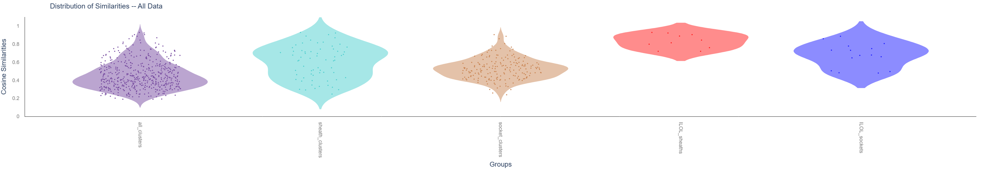

In [12]:
# colors
colormap = {
    'all_clusters':'#693996',
    'sheath_clusters':SHEATH_COLOR,
    'socket_clusters':SOCKET_COLOR,
    'ILOL_sheaths':'red',
    'ILOL_sockets':'blue'
}

# assign the chart to the figure
fig = px.violin(data_frame=plot_vals, x='label', y='pairwise_val', color='label', color_discrete_map=colormap)

# plot aesthetics and customization
fig.update_layout(
    height=600,
    width=900,
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis=dict(title='Cosine Similarities', ticksuffix="   "),
    xaxis=dict(title='Groups', tickprefix="   "),
    title=dict(text='Distribution of Similarities -- All Data', font=dict(size=25)),
    font=dict(
        family='Arial',
        size=20
    ),
)

fig.update_xaxes(showgrid=False, tickangle=90, tickfont=dict(family='Arial', color='gray', \
                                                   size=18), showline=True, linecolor='black', gridcolor='lightgray')
fig.update_yaxes(showgrid=False, tickfont=dict(family='Arial', color='gray', \
                                     size=18), range=[0,1.1], showline=True, linecolor='black', gridcolor='lightgray')

fig.update_traces(box_visible=False, meanline_visible=True, 
                  opacity=0.9, points='all', pointpos=-0, jitter=0.6,
                  marker_line_color='rgba(0,0,0,0)',line=dict(width=0),
                  marker_line_width=0, showlegend=False, width=0.75, marker_size=4)

fig.show()
fig.write_image('figures/S3G_CosineSim_Distribution_AllData.png')
fig.write_html('figures/S3G_CosineSim_Distribution_AllData.html')

# SFig 3H -- <i>B0238.12</i> Expression

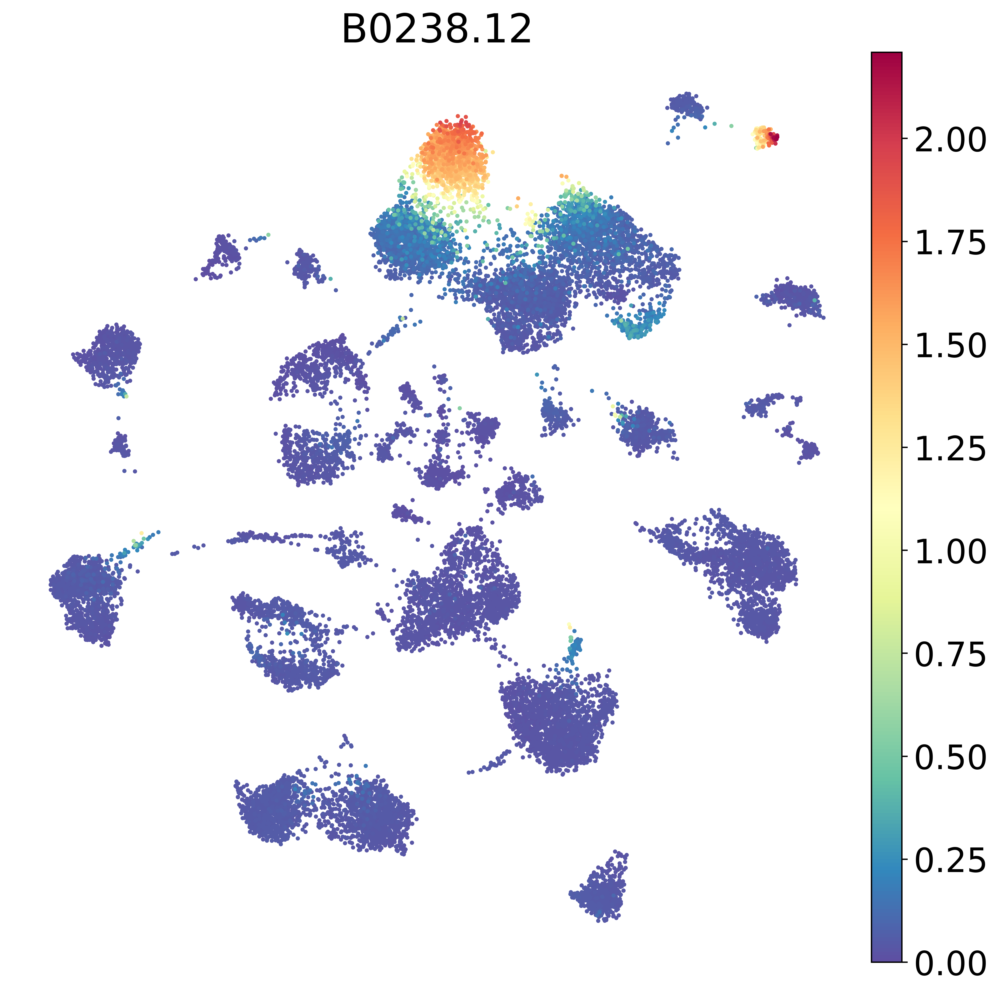

In [13]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 20.0}):
    PLOT_GENES = ['B0238.12']
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S3H_{gene}.png',
            layer='magic_imputed_postBC'
        )

<!-- # SFig 3H -- <i>col-69</i> Expression -->
# SFig 3I -- <i>C25E10.7</i> Expression

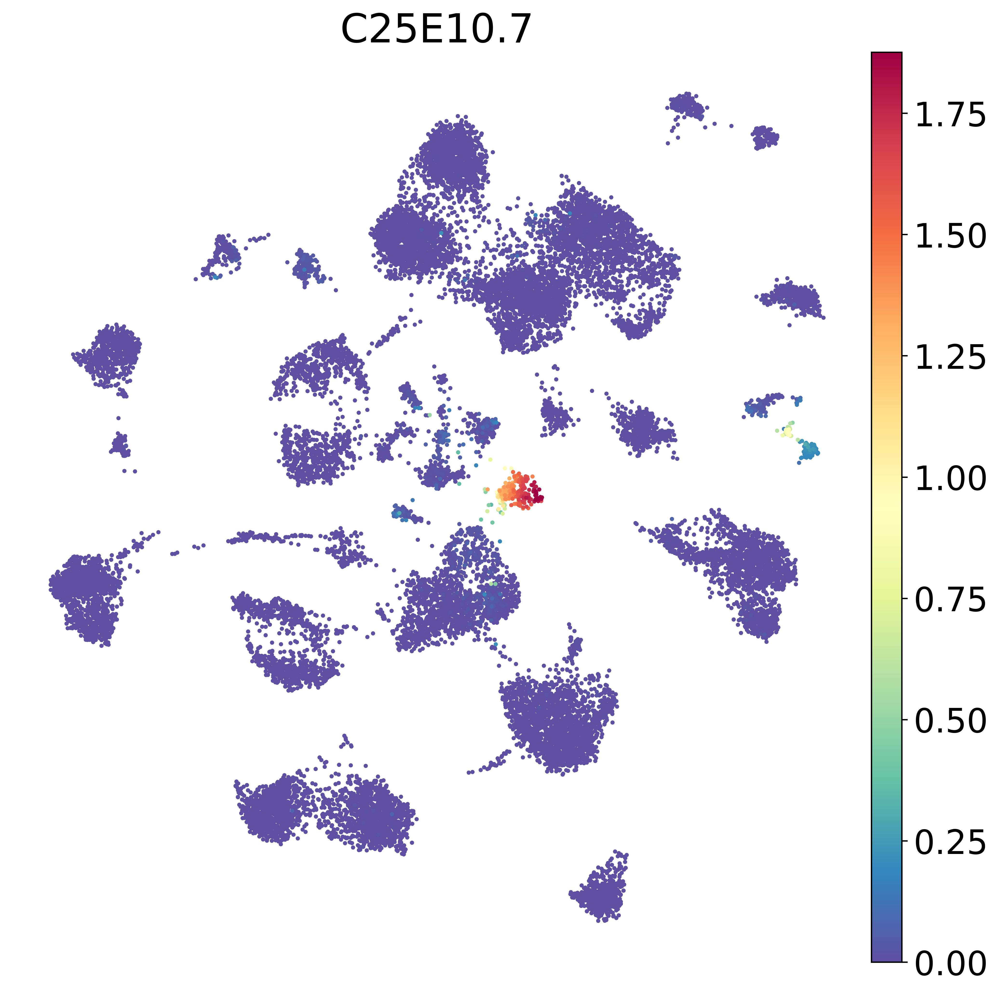

In [14]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 20.0}):
    # PLOT_GENES = ['col-69','C25E10.7']
    PLOT_GENES = ['C25E10.7']
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S3I_{gene}.png',
            layer='magic_imputed_postBC'
        )

# SFig 3J -- <i>C49F5.7 </i> Expression

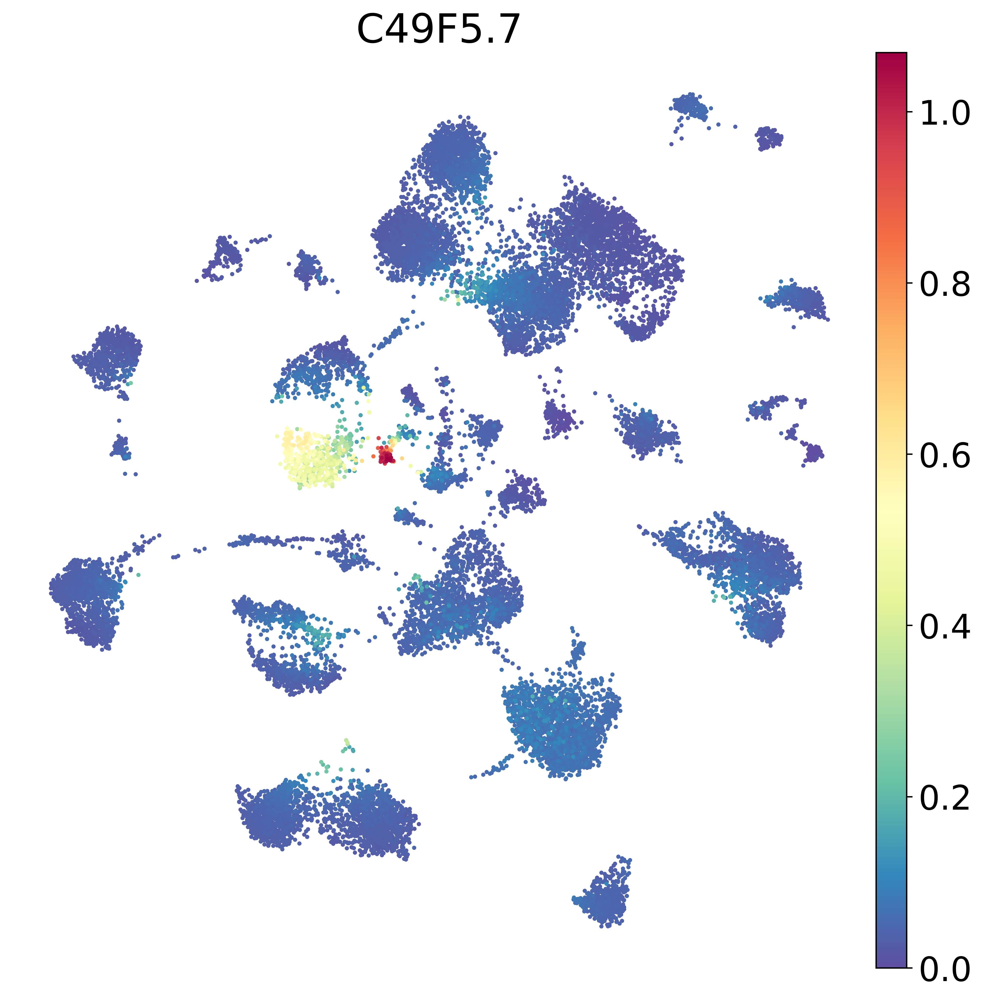

In [15]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 20.0}):
    PLOT_GENES = ['C49F5.7']
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S3J_{gene}.png',
            layer='magic_imputed_postBC'
        )

# SFig 3K -- <i>grd-10</i> Expression

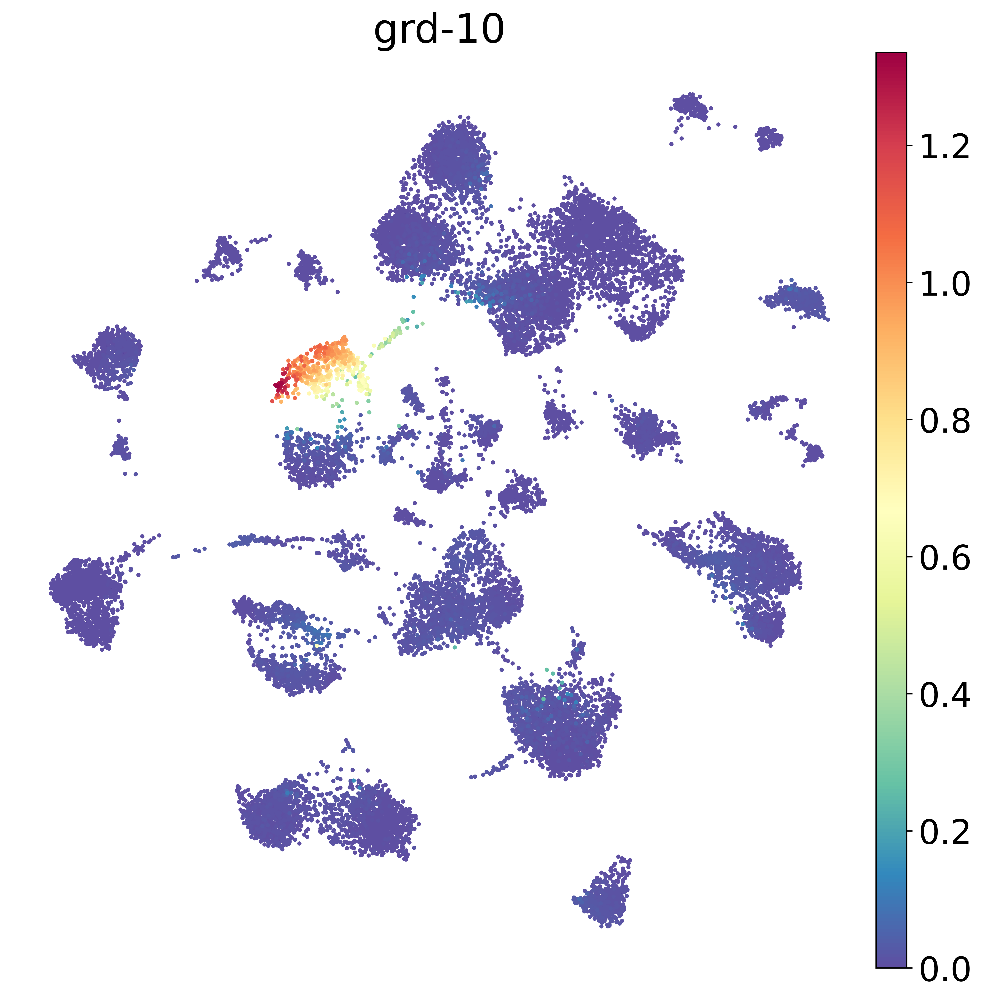

In [16]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE,'font.size': 20.0}):
    PLOT_GENES = ['grd-10']
    for gene in PLOT_GENES:
        sc.pl.umap(
            adata,
            color=[gene],
            frameon=False,
            size=DOT_SIZE,
            save=f'figure_S3K_{gene}.png',
            layer='magic_imputed_postBC'
        )

# SFig 3L -- Pairwise Cluster 13

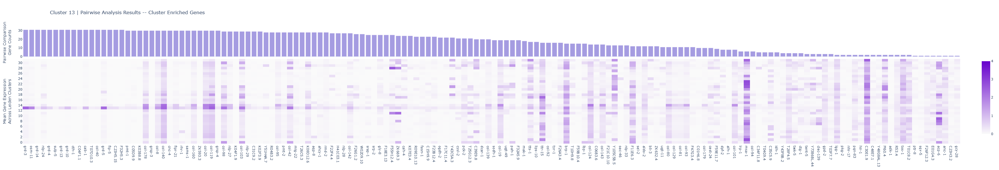

In [17]:
figure_utils.get_pairwise_results(ad_data=adata, cluster_id='13', filename=f'figures/pairwisefigure_S3L_Cluster13')

# SFig 3M -- Pairwise Cluster 14

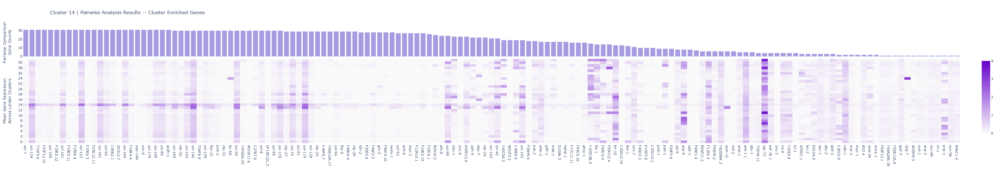

In [18]:
figure_utils.get_pairwise_results(ad_data=adata, cluster_id='14', filename=f'figures/pairwisefigure_S3M_Cluster14')